# Take Home Assignment

## Part A Section 1

### Deep Learning Algorithm #1: YOLO

In [1]:
from ultralytics import YOLO
from PIL import Image
import matplotlib.pyplot as plt
import os

In [2]:
pip install ultralytics

Note: you may need to restart the kernel to use updated packages.


In [3]:
model = YOLO("yolov8m.pt")


image 1/1 /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_1118.jpg: 480x640 3 persons, 126.4ms
Speed: 3.3ms preprocess, 126.4ms inference, 4.1ms postprocess per image at shape (1, 3, 480, 640)


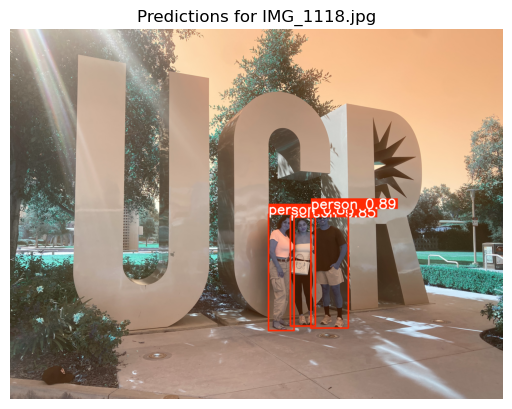


image 1/1 /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_0714.jpg: 480x640 17 persons, 1 airplane, 20 chairs, 127.7ms
Speed: 2.9ms preprocess, 127.7ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)


/var/folders/9f/g3mh126s0s546sbywzbxhf2h0000gn/T/ipykernel_55051/2284801469.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  class_id = int(box.cls.cpu().numpy())  # Convert class index to integer
/var/folders/9f/g3mh126s0s546sbywzbxhf2h0000gn/T/ipykernel_55051/2284801469.py:35: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  probability = float(box.conf.cpu().numpy())  # Confidence score


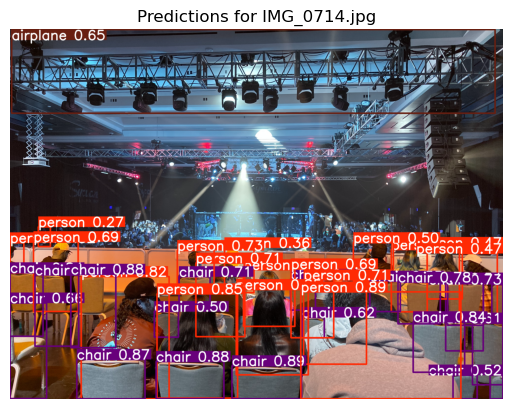


image 1/1 /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_0304.jpg: 640x480 1 traffic light, 1 chair, 131.7ms
Speed: 2.1ms preprocess, 131.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 480)


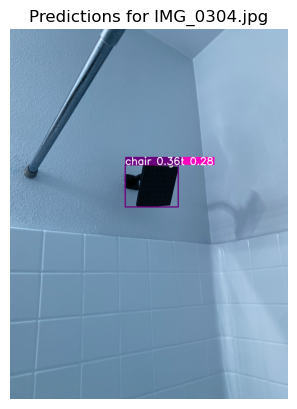


image 1/1 /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_0356 2.jpg: 480x640 (no detections), 119.6ms
Speed: 2.4ms preprocess, 119.6ms inference, 0.3ms postprocess per image at shape (1, 3, 480, 640)


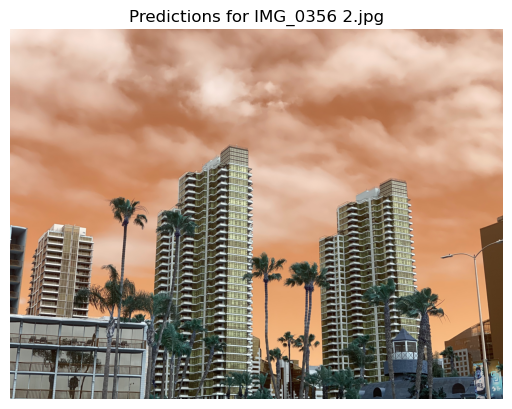


image 1/1 /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_1215.jpg: 480x640 1 dog, 128.2ms
Speed: 1.9ms preprocess, 128.2ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


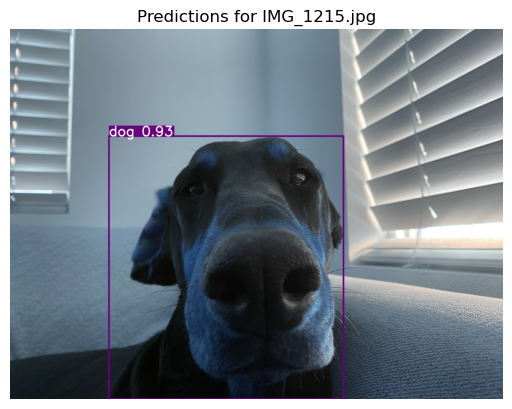


image 1/1 /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_0321.jpg: 640x480 3 persons, 3 cars, 152.0ms
Speed: 2.9ms preprocess, 152.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


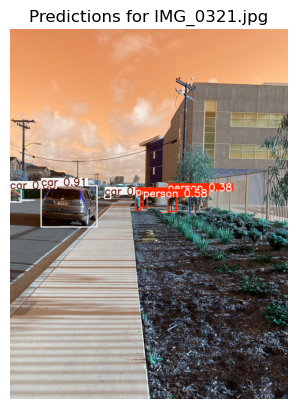


image 1/1 /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_1175.jpg: 640x224 9 persons, 78.6ms
Speed: 1.4ms preprocess, 78.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 224)


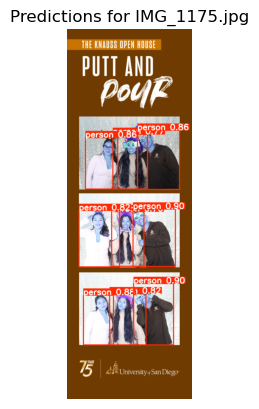


image 1/1 /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_1010.jpg: 480x640 13 persons, 3 chairs, 4 tvs, 139.4ms
Speed: 2.4ms preprocess, 139.4ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


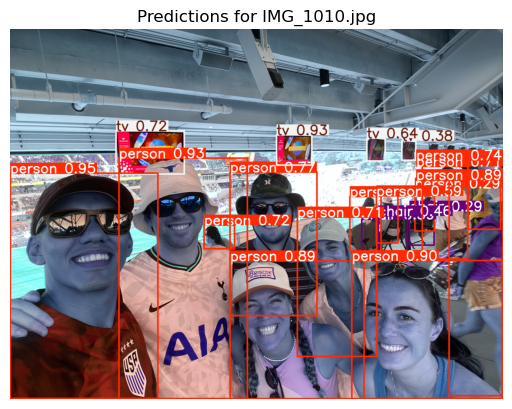


image 1/1 /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_0496.jpg: 480x640 10 persons, 1 tie, 1 wine glass, 3 cups, 135.6ms
Speed: 2.3ms preprocess, 135.6ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)


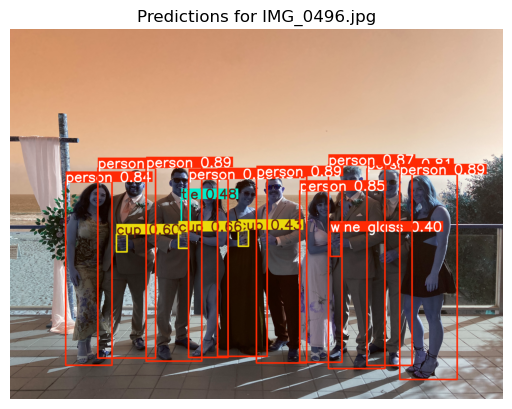


image 1/1 /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_0253.jpg: 640x480 1 dog, 1 sheep, 1 couch, 157.7ms
Speed: 2.0ms preprocess, 157.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


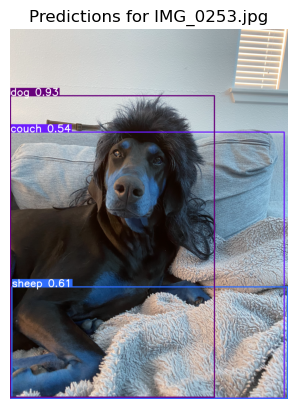

Predictions Results:


,Filename,Object Type,Coordinates,Probability
0,IMG_1118.jpg,person,"[[2461.810302734375, 1469.307861328125, 2767.4...",0.892680
1,IMG_1118.jpg,person,"[[2114.709716796875, 1513.9794921875, 2323.785...",0.882111
2,IMG_1118.jpg,person,"[[2293.46923828125, 1538.673828125, 2497.44067...",0.849504
3,IMG_0714.jpg,person,"[[2378.806396484375, 2148.297607421875, 3687.0...",0.889807
4,IMG_0714.jpg,chair,"[[1815.4971923828125, 2752.938720703125, 2384....",0.886704
...,...,...,...,...
92,IMG_0496.jpg,cup,"[[1867.31201171875, 1640.4097900390625, 1950.9...",0.432337
93,IMG_0496.jpg,wine glass,"[[2619.654296875, 1655.205322265625, 2706.4091...",0.402434
94,IMG_0253.jpg,dog,"[[4.109381198883057, 727.7553100585938, 2223.5...",0.925101
95,IMG_0253.jpg,sheep,"[[20.41097640991211, 2810.548095703125, 3018.1...",0.611076


In [4]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Define the folder path
folder_path = '/Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images'

# Initialize a list to store results for the DataFrame
data = []

# Iterate through all images in the folder
for filename in os.listdir(folder_path):
    if filename.endswith(('.png', '.jpg', '.jpeg')):  # Ensure it's an image file
        image_path = os.path.join(folder_path, filename)
        
        # Predict the objects in the image
        results = model.predict(image_path)
        result = results[0]

        # Display the image with predictions
        annotated_image = result.plot()
        plt.imshow(annotated_image)
        plt.axis('off')  # Turn off the axes for better visualization
        plt.title(f"Predictions for {filename}")
        plt.show()


        # Extract information for the DataFrame
        if result.boxes:  # Ensure there are detected boxes
            for box in result.boxes:
                class_id = int(box.cls.cpu().numpy())  # Convert class index to integer
                class_name = result.names[class_id]  # Map class ID to class name
                coordinates = box.xyxy.cpu().numpy().tolist()  # Bounding box coordinates
                probability = float(box.conf.cpu().numpy())  # Confidence score

                data.append({
                    "Filename": filename,
                    "Object Type": class_name,
                    "Coordinates": coordinates,
                    "Probability": probability
                })

# Create the DataFrame
yolo_results = pd.DataFrame(data)

# Save the DataFrame to a CSV file
csv_save_path = os.path.join(folder_path, "predictions_results.csv")
yolo_results.to_csv(csv_save_path, index=False)

# Print the DataFrame to console
print("Predictions Results:")
yolo_results

## Part A Section 1

### Deep Learning Algorithm #2: R-CNN

Processing image: /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_1118.jpg


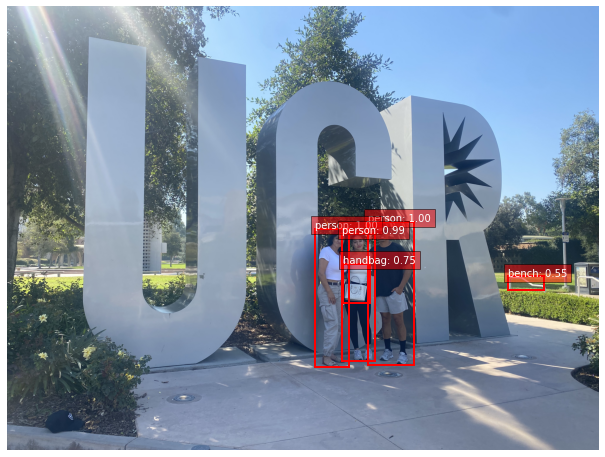

Processing image: /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_0714.jpg


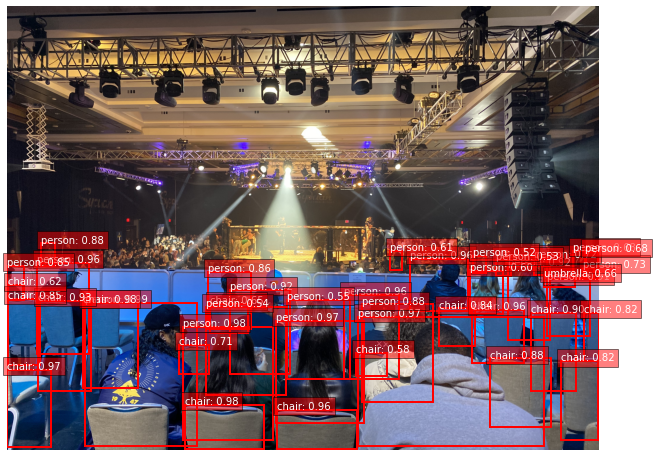

Processing image: /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_0304.jpg


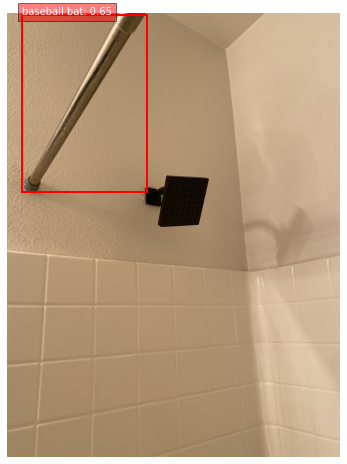

Processing image: /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_0356 2.jpg


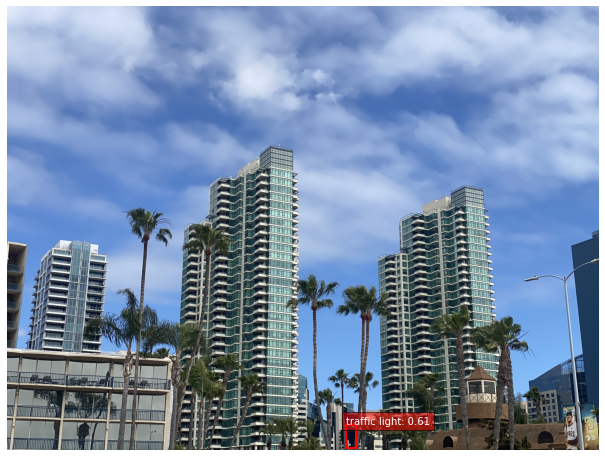

Processing image: /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_1215.jpg


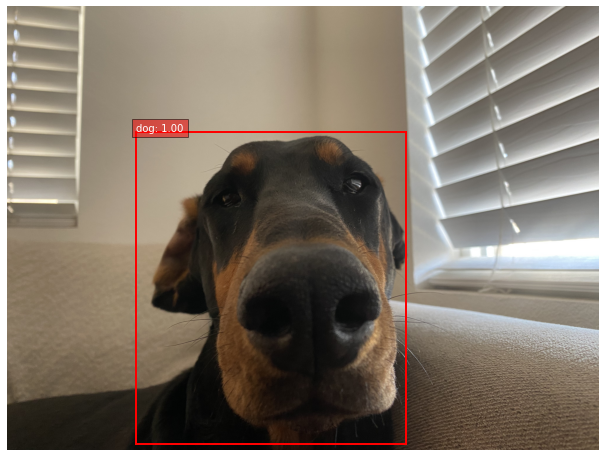

Processing image: /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_0321.jpg


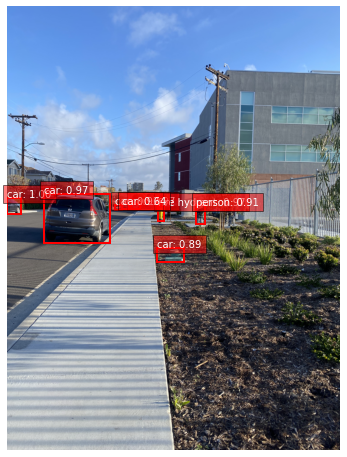

Processing image: /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_1175.jpg


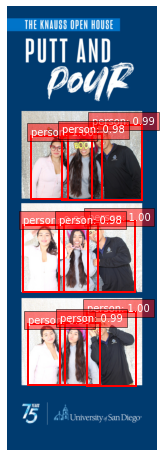

Processing image: /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_1010.jpg


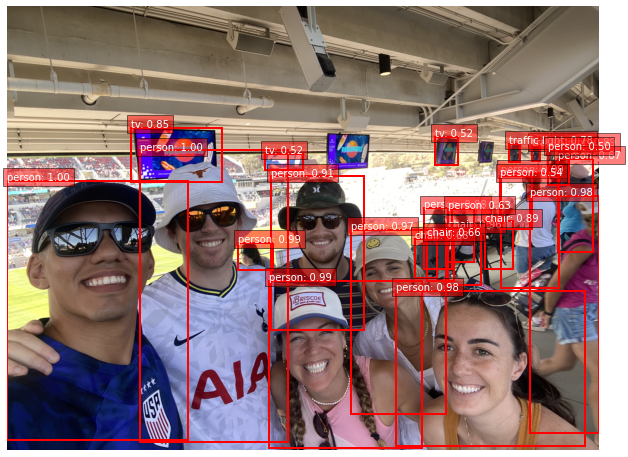

Processing image: /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_0496.jpg


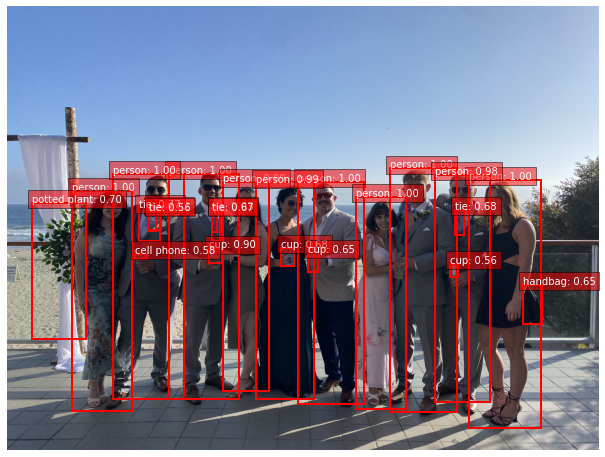

Processing image: /Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images/IMG_0253.jpg


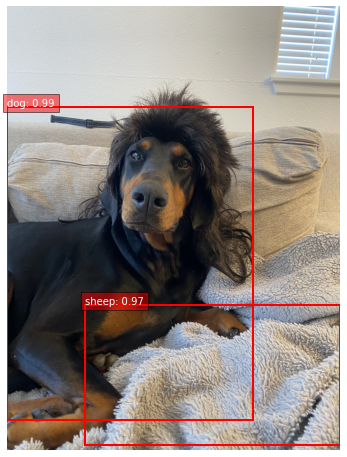

,Filename,Object Type,Coordinates,Probability
0,IMG_1118.jpg,person,"[2459.02587890625, 1469.41943359375, 2772.4658...",0.999019
1,IMG_1118.jpg,person,"[2096.769287109375, 1519.0003662109375, 2327.4...",0.997883
2,IMG_1118.jpg,person,"[2281.339599609375, 1553.0234375, 2503.8395996...",0.994279
3,IMG_1118.jpg,handbag,"[2290.807373046875, 1755.975830078125, 2470.47...",0.745693
4,IMG_1118.jpg,bench,"[3414.61767578125, 1841.375244140625, 3662.359...",0.550222
...,...,...,...,...
109,IMG_0496.jpg,cell phone,"[874.1597290039062, 1689.25439453125, 953.9412...",0.584069
110,IMG_0496.jpg,cup,"[3020.259765625, 1754.42822265625, 3072.744628...",0.561437
111,IMG_0496.jpg,tie,"[967.8385009765625, 1394.37451171875, 1049.821...",0.556768
112,IMG_0253.jpg,dog,"[0.0, 915.415771484375, 2235.124755859375, 375...",0.988974


In [5]:
import os
from PIL import Image
import torch
import pandas as pd
from torchvision import transforms
import torchvision.models.detection as detection
from torchvision.models.detection.faster_rcnn import FasterRCNN_ResNet50_FPN_Weights
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torchvision.transforms.functional as F

# Step 1: Load the pre-trained Faster R-CNN model
weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
model = detection.fasterrcnn_resnet50_fpn(weights=weights)
model.eval()

# Dynamically fetch COCO class names
COCO_CLASSES = weights.meta["categories"]

# Path to the folder containing the images
folder_path = '/Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images'

# Ensure the input folder exists
if not os.path.exists(folder_path):
    print(f"Folder '{folder_path}' does not exist!")
    exit()

# Confidence threshold for filtering predictions
confidence_threshold = 0.5

# List to store results for the DataFrame
results_list = []

# Loop through each file in the folder
for filename in os.listdir(folder_path):
    # Construct the full path to the image
    image_path = os.path.join(folder_path, filename)

    # Skip files that are not images
    if not filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        continue

    print(f"Processing image: {image_path}")

    # Step 2: Load the image
    try:
        image = Image.open(image_path).convert('RGB')  # Ensure the image is in RGB format
    except Exception as e:
        print(f"Error loading image {filename}: {e}")
        continue

    # Convert the image to a tensor
    image_tensor = F.to_tensor(image)

    # Step 3: Perform object detection
    with torch.no_grad():
        predictions = model([image_tensor])

    # Step 4: Extract and filter predictions
    predicted_boxes = predictions[0]['boxes']
    predicted_scores = predictions[0]['scores']
    predicted_labels = predictions[0]['labels']

    for box, score, label in zip(predicted_boxes, predicted_scores, predicted_labels):
        if score >= confidence_threshold:
            # Convert box to a list of coordinates
            coordinates = box.tolist()
            class_name = COCO_CLASSES[label.item()]
            probability = score.item()

            # Append result to the list
            results_list.append({
                "Filename": filename,
                "Object Type": class_name,
                "Coordinates": coordinates,
                "Probability": probability
            })

    # Optional: Display the image with annotations
    fig, ax = plt.subplots(1, figsize=(12, 8), dpi=72)
    ax.imshow(image)

    for box, score, label in zip(predicted_boxes, predicted_scores, predicted_labels):
        if score >= confidence_threshold:
            x_min, y_min, x_max, y_max = box.tolist()
            class_name = COCO_CLASSES[label.item()]

            # Draw the bounding box
            rect = patches.Rectangle(
                (x_min, y_min),
                x_max - x_min,
                y_max - y_min,
                linewidth=2,
                edgecolor='red',
                facecolor='none'
            )
            ax.add_patch(rect)

            # Add the class name and score as text
            ax.text(
                x_min,
                y_min - 5,
                f"{class_name}: {score:.2f}",
                color='white',
                fontsize=10,
                bbox=dict(facecolor='red', alpha=0.5)
            )

    plt.axis("off")  # Hide axes for better visualization
    plt.show()

# Step 5: Create a DataFrame from the results list
rnn_results = pd.DataFrame(results_list)

rnn_results

In [6]:
yolo_results.head()

,Filename,Object Type,Coordinates,Probability
0,IMG_1118.jpg,person,"[[2461.810302734375, 1469.307861328125, 2767.4...",0.892680
1,IMG_1118.jpg,person,"[[2114.709716796875, 1513.9794921875, 2323.785...",0.882111
2,IMG_1118.jpg,person,"[[2293.46923828125, 1538.673828125, 2497.44067...",0.849504
3,IMG_0714.jpg,person,"[[2378.806396484375, 2148.297607421875, 3687.0...",0.889807
4,IMG_0714.jpg,chair,"[[1815.4971923828125, 2752.938720703125, 2384....",0.886704


In [7]:
rnn_results.head()

,Filename,Object Type,Coordinates,Probability
0,IMG_1118.jpg,person,"[2459.02587890625, 1469.41943359375, 2772.4658...",0.999019
1,IMG_1118.jpg,person,"[2096.769287109375, 1519.0003662109375, 2327.4...",0.997883
2,IMG_1118.jpg,person,"[2281.339599609375, 1553.0234375, 2503.8395996...",0.994279
3,IMG_1118.jpg,handbag,"[2290.807373046875, 1755.975830078125, 2470.47...",0.745693
4,IMG_1118.jpg,bench,"[3414.61767578125, 1841.375244140625, 3662.359...",0.550222


## Part A Section 2: Extracting Anything else from Images without using Deep Learning Algorithms

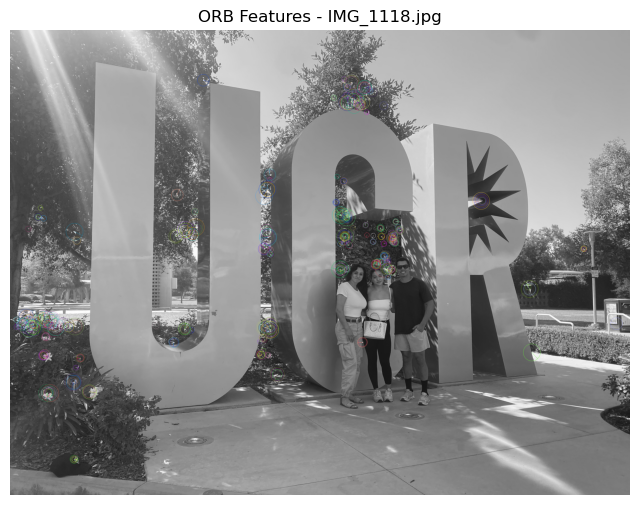

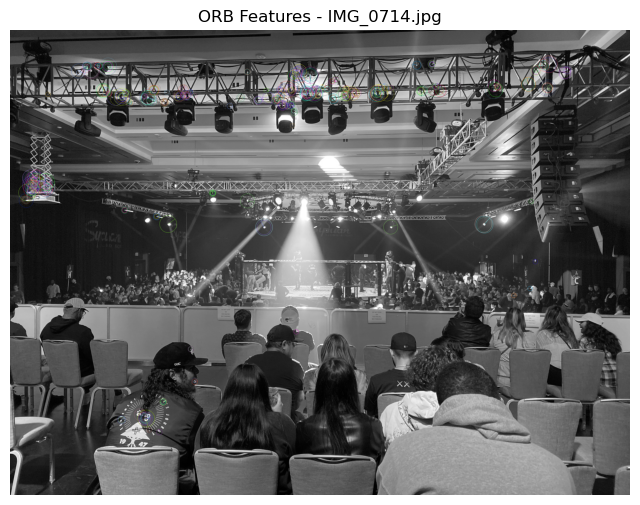

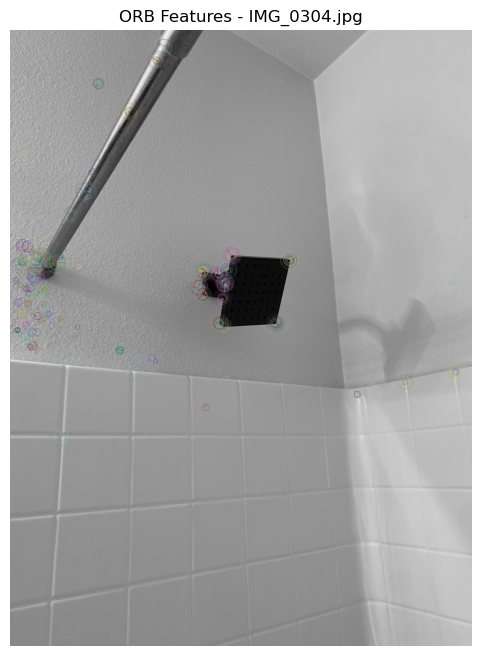

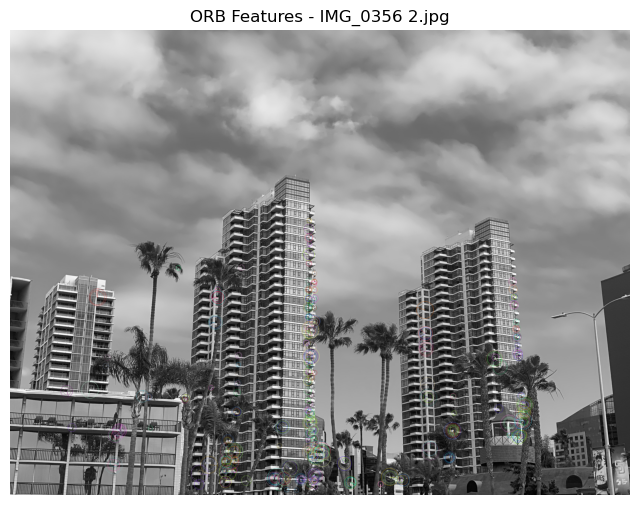

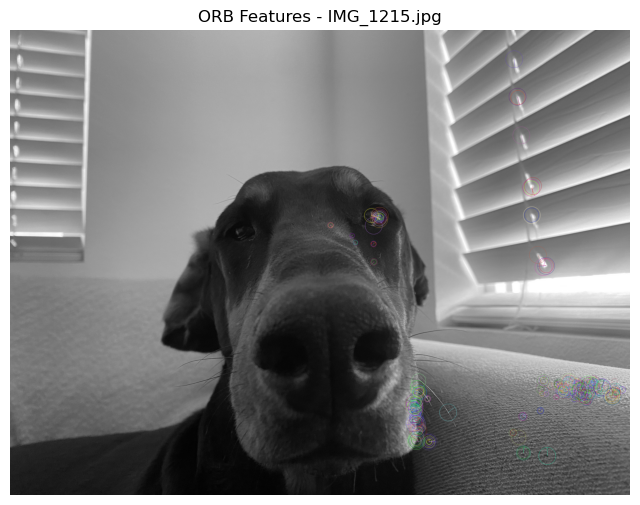

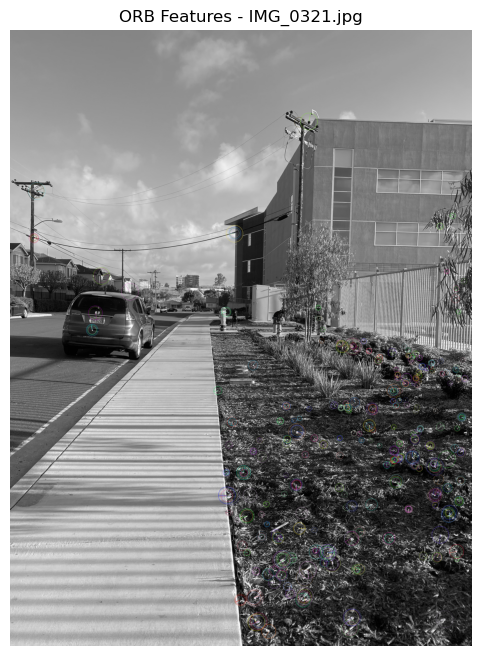

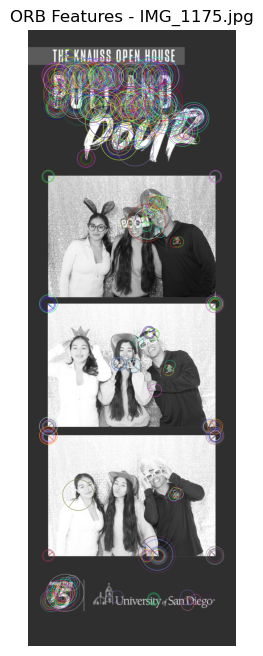

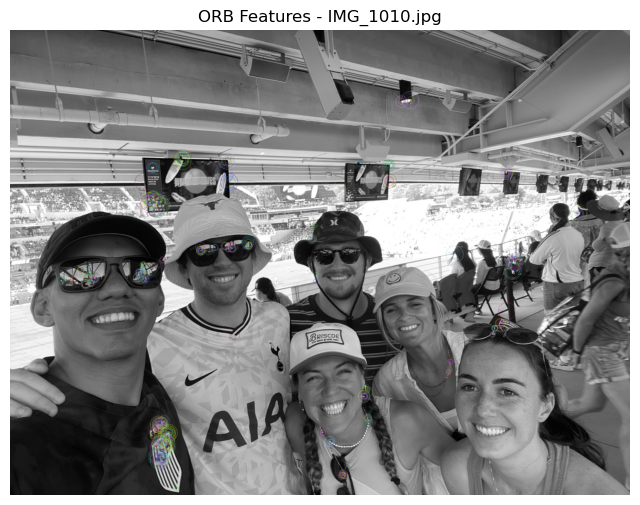

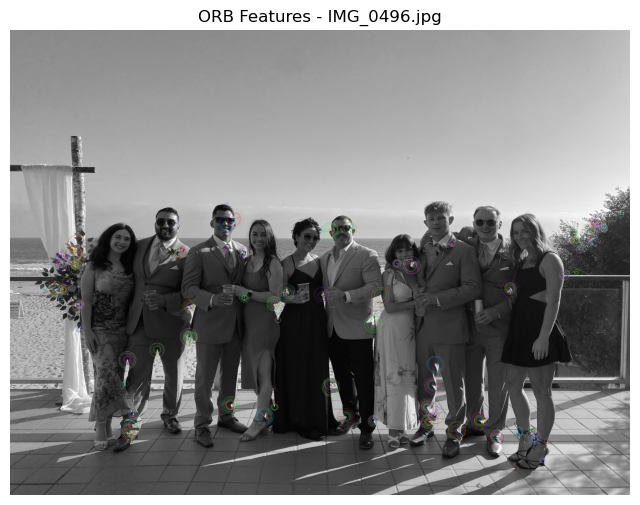

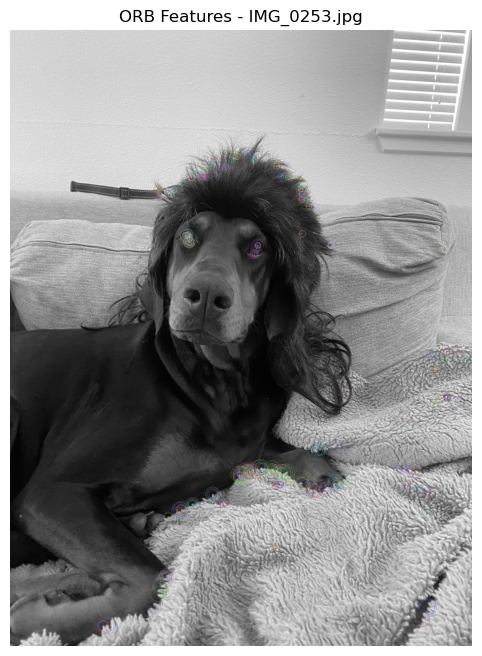

             Image  Keypoint #                          Location (x, y)  \
0     IMG_1118.jpg           1                         (2184.0, 1207.0)   
1     IMG_1118.jpg           2                         (2440.0, 1494.0)   
2     IMG_1118.jpg           3                         (2456.0, 1504.0)   
3     IMG_1118.jpg           4                           (40.0, 1931.0)   
4     IMG_1118.jpg           5                          (416.0, 2791.0)   
...            ...         ...                                      ...   
4995  IMG_0253.jpg         496   (942.3768310546875, 3755.174560546875)   
4996  IMG_0253.jpg         497   (2006.581787109375, 2759.050048828125)   
4997  IMG_0253.jpg         498    (1913.4190673828125, 2977.6240234375)   
4998  IMG_0253.jpg         499  (1780.8414306640625, 2898.794189453125)   
4999  IMG_0253.jpg         500          (1809.5068359375, 2895.2109375)   

      Scale (size)  Orientation (angle)  
0        31.000000             1.436895  
1        31.000

In [8]:
import cv2
import os
import pandas as pd

# Define the folder path containing the images
folder_path = '/Users/carlosvelazquez/Desktop/MSBA/Analytical Programming II/images'

# Initialize a list to hold the metadata for all images
keypoint_data = []

# Iterate through all image files in the folder
for filename in os.listdir(folder_path):
    if filename.endswith(('.png', '.jpg', '.jpeg')):  # Process only image files
        # Construct the full path to the image
        image_path = os.path.join(folder_path, filename)
        
        # Read the image
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # ORB works with grayscale images
        
        # Initialize the ORB detector with a higher nfeatures limit
        orb = cv2.ORB_create(nfeatures=500)
        
        # Detect keypoints and compute descriptors
        keypoints, descriptors = orb.detectAndCompute(image, None)
        
                # Draw keypoints on the image
        image_with_keypoints = cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        
        # Display the image with keypoints
        plt.figure(figsize=(8, 8))
        plt.imshow(image_with_keypoints, cmap='gray')
        plt.title(f"ORB Features - {filename}")
        plt.axis('off')
        plt.show()
        
        # Collect metadata for each keypoint
        for i, keypoint in enumerate(keypoints):
            keypoint_data.append({
                "Image": filename,
                "Keypoint #": i + 1,
                "Location (x, y)": keypoint.pt,  # Keypoint coordinates
                "Scale (size)": keypoint.size,  # Keypoint region size
                "Orientation (angle)": keypoint.angle,  # Dominant gradient direction

            })

# Convert the metadata to a DataFrame
df_keypoints = pd.DataFrame(keypoint_data)

# Display the DataFrame
print(df_keypoints)
        


## Comparison Table & Visualizations

In [9]:
yolo_results["above_90_percent"] = (yolo_results["Probability"] > 0.90).astype(int)
yolo_results["below_90_percent"] = (yolo_results["Probability"] <= 0.90).astype(int)

In [10]:
yolo_counts = yolo_results.groupby(["Filename", "Object Type"]).size().reset_index(name="Count")

yolo_counts

,Filename,Object Type,Count
0,IMG_0253.jpg,couch,1
1,IMG_0253.jpg,dog,1
2,IMG_0253.jpg,sheep,1
3,IMG_0304.jpg,chair,1
4,IMG_0304.jpg,traffic light,1
5,IMG_0321.jpg,car,3
6,IMG_0321.jpg,person,3
7,IMG_0496.jpg,cup,3
8,IMG_0496.jpg,person,10
9,IMG_0496.jpg,tie,1


In [11]:
# Calculate the sum of the 'above_90_percent' column
sum_above_90 = yolo_results['above_90_percent'].sum()
sum_below_90 = yolo_results['below_90_percent'].sum()
sum_count_yolo = yolo_counts['Count'].sum()
unique_object_types = yolo_counts['Object Type'].unique()
num_unique_objects = len(unique_object_types)

# Print the results
print(f"Sum of 'above_90_percent': {sum_above_90}")
print(f"Sum of 'below_90_percent': {sum_below_90}")
print(f"Sum of 'Objects Noticed': {sum_count_yolo}")
print(f"Sum of 'Unqiue Objects Noticed': {num_unique_objects}")

data = {
    "Metric": ["Sum of 'above_90_percent'", "Sum of 'below_90_percent'", "Sum of 'Objects Noticed'", "Sum of 'Unique Objects Noticed'"],
    "Value": [sum_above_90, sum_below_90, sum_count_yolo, num_unique_objects]
}

yolo_summary = pd.DataFrame(data)
yolo_summary

Sum of 'above_90_percent': 8
Sum of 'below_90_percent': 89
Sum of 'Objects Noticed': 97
Sum of 'Unqiue Objects Noticed': 12


,Metric,Value
0,Sum of 'above_90_percent',8
1,Sum of 'below_90_percent',89
2,Sum of 'Objects Noticed',97
3,Sum of 'Unique Objects Noticed',12


In [12]:
rnn_results["above_90_percent"] = (rnn_results["Probability"] > 0.90).astype(int)
rnn_results["below_90_percent"] = (rnn_results["Probability"] <= 0.90).astype(int)

rnn_results

,Filename,Object Type,Coordinates,Probability,above_90_percent,below_90_percent
0,IMG_1118.jpg,person,"[2459.02587890625, 1469.41943359375, 2772.4658...",0.999019,1,0
1,IMG_1118.jpg,person,"[2096.769287109375, 1519.0003662109375, 2327.4...",0.997883,1,0
2,IMG_1118.jpg,person,"[2281.339599609375, 1553.0234375, 2503.8395996...",0.994279,1,0
3,IMG_1118.jpg,handbag,"[2290.807373046875, 1755.975830078125, 2470.47...",0.745693,0,1
4,IMG_1118.jpg,bench,"[3414.61767578125, 1841.375244140625, 3662.359...",0.550222,0,1
...,...,...,...,...,...,...
109,IMG_0496.jpg,cell phone,"[874.1597290039062, 1689.25439453125, 953.9412...",0.584069,0,1
110,IMG_0496.jpg,cup,"[3020.259765625, 1754.42822265625, 3072.744628...",0.561437,0,1
111,IMG_0496.jpg,tie,"[967.8385009765625, 1394.37451171875, 1049.821...",0.556768,0,1
112,IMG_0253.jpg,dog,"[0.0, 915.415771484375, 2235.124755859375, 375...",0.988974,1,0


In [13]:
rnn_counts = rnn_results.groupby(["Filename", "Object Type"]).size().reset_index(name="Count")
rnn_counts

,Filename,Object Type,Count
0,IMG_0253.jpg,dog,1
1,IMG_0253.jpg,sheep,1
2,IMG_0304.jpg,baseball bat,1
3,IMG_0321.jpg,car,6
4,IMG_0321.jpg,fire hydrant,1
5,IMG_0321.jpg,person,1
6,IMG_0356 2.jpg,traffic light,1
7,IMG_0496.jpg,cell phone,1
8,IMG_0496.jpg,cup,4
9,IMG_0496.jpg,handbag,1


In [14]:
# Calculate the sum of the 'above_90_percent' column
sum_above_90 = rnn_results['above_90_percent'].sum()
sum_below_90 = rnn_results['below_90_percent'].sum()
sum_count_yolo = rnn_counts['Count'].sum()
unique_object_types = rnn_counts['Object Type'].unique()
num_unique_objects = len(unique_object_types)

# Print the results
print(f"Sum of 'above_90_percent': {sum_above_90}")
print(f"Sum of 'below_90_percent': {sum_below_90}")
print(f"Sum of 'Objects Noticed': {sum_count_yolo}")
print(f"Sum of 'Unqiue Objects Noticed': {num_unique_objects}")

data = {
    "Metric": ["Sum of 'above_90_percent'", "Sum of 'below_90_percent'", "Sum of 'Objects Noticed'", "Sum of 'Unique Objects Noticed'"],
    "Value": [sum_above_90, sum_below_90, sum_count_yolo, num_unique_objects]
}

rnn_summary = pd.DataFrame(data)
rnn_summary

Sum of 'above_90_percent': 59
Sum of 'below_90_percent': 55
Sum of 'Objects Noticed': 114
Sum of 'Unqiue Objects Noticed': 16


,Metric,Value
0,Sum of 'above_90_percent',59
1,Sum of 'below_90_percent',55
2,Sum of 'Objects Noticed',114
3,Sum of 'Unique Objects Noticed',16


In [15]:
both_summary = {
    "Model": ["YOLO", "RNN"],
    "Detect Above 90%": [8, 59],
    "Detect Below 90%": [89, 55],
    "Objects Noticed": [97, 114],
    "Unique Objects Noticed": [12, 16]
}

both_summary = pd.DataFrame(both_summary)

both_summary

,Model,Detect Above 90%,Detect Below 90%,Objects Noticed,Unique Objects Noticed
0,YOLO,8,89,97,12
1,RNN,59,55,114,16


## Visualizations Comparing Both Models

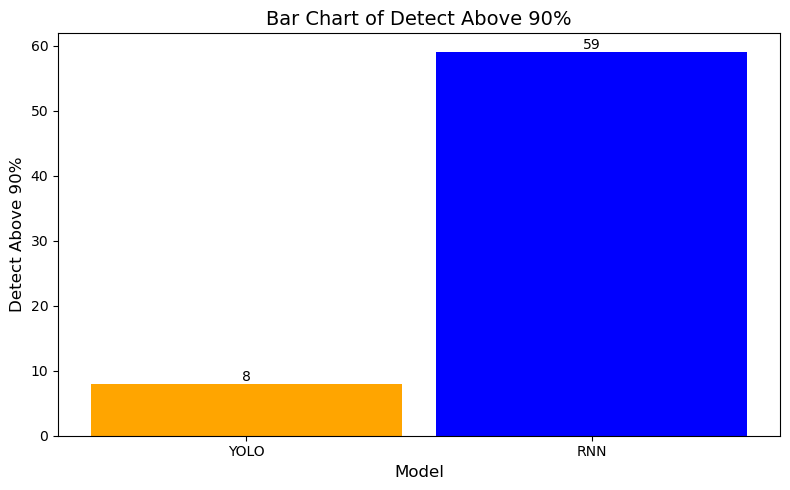

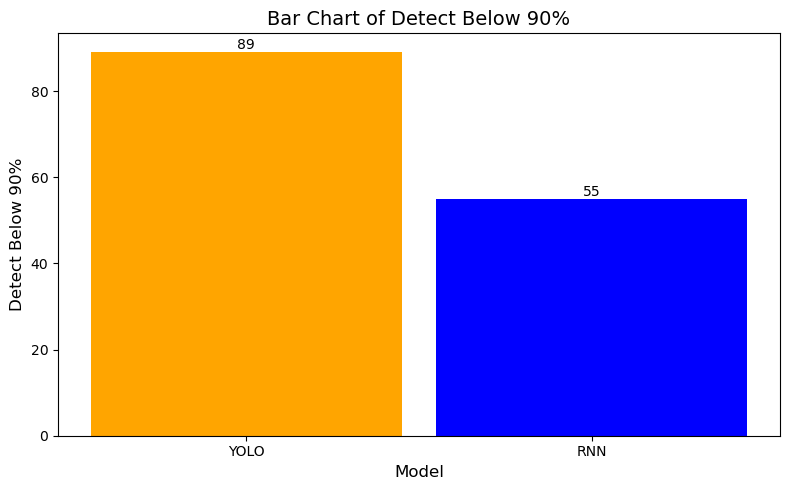

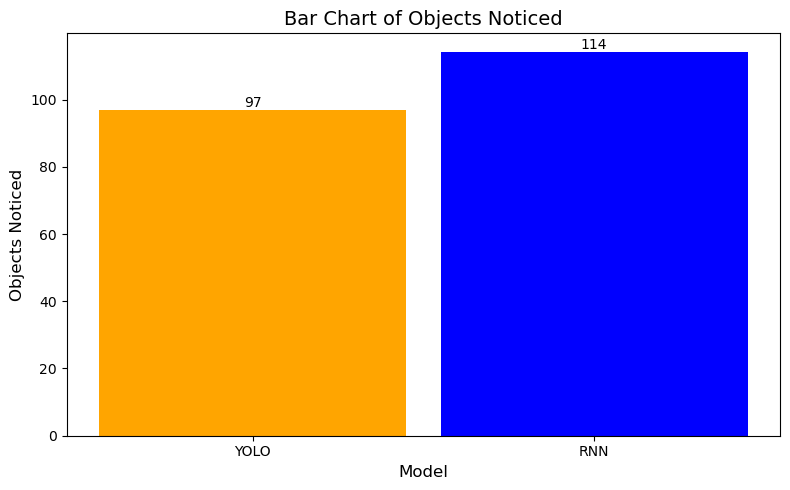

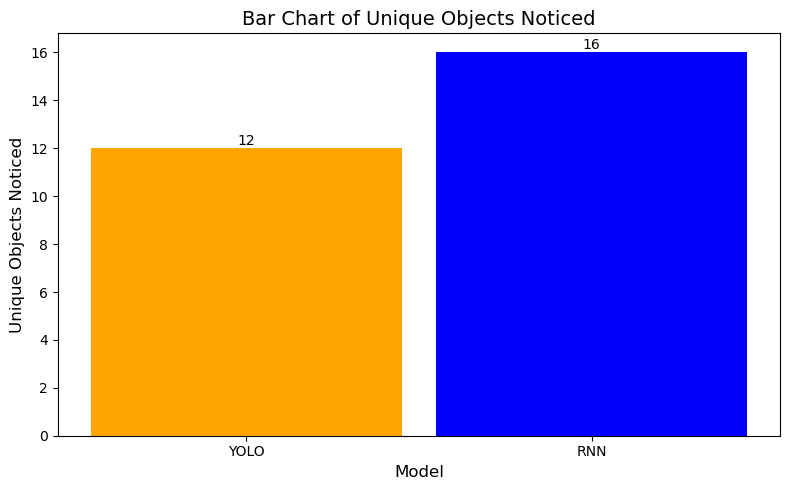

In [27]:
import matplotlib.pyplot as plt

# Loop through all columns in the DataFrame except the first one (e.g., 'Model')
for column in both_summary.columns[1:]:
    plt.figure(figsize=(8, 5))
    
    # Adjust bar width and align positions for closer bars
    bar_positions = range(len(both_summary['Model']))
    bar_width = .9  # Adjust bar width for closer spacing
    
    # Create the bar chart with specified colors
    bars = plt.bar(bar_positions, both_summary[column], color=['orange', 'blue'], width=bar_width)
    
    # Add labels to each bar
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2, 
            height, 
            f'{height:.0f}', 
            ha='center', 
            va='bottom', 
            fontsize=10
        )
    
    # Customize x-axis labels and ticks
    plt.xticks(bar_positions, both_summary['Model'])
    
    plt.title(f"Bar Chart of {column}", fontsize=14)
    plt.xlabel("Model", fontsize=12)
    plt.ylabel(column, fontsize=12)
    plt.tight_layout()
    plt.show()
    